In [1]:
"""
Train a baseline model using basic preprocessing pipeline.
Dataset is 12000 opinions pulled randomly; 4000 from each jurisdiction.
Iteration will be easier with a smaller dataset. This notebook is aimed at assessing whether a signal
can be detected with only 12000 opinions.
The opinions were chosen from the list of those which either cite another case in the corpus, or which
are cited by another case in the corpus.
"""

import pandas as pd

%matplotlib inline
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os
import time

import spacy

from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel

import networkx as nx

from sklearn.neighbors import NearestNeighbors

import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

data_raw = pd.read_csv('../data_uncompressed/random_cases2_raw.csv')




In [2]:
# PREPROCESS (if necessary; otherwise skip to next cell):

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])


start = time.time()
opinions = []
print('Beginning preprocessing of opinions...')
for i, row in data_raw.iterrows():
    case_id = row.case_id
    juris = row.jurisdiction
    text = row.opinion
    court = row.court_name
    decision_year = pd.to_datetime(row.decision_date).year
    doc = nlp(text)
    doc = [t for t in doc if not t.is_stop]
    doc = [t.lemma_ for t in doc if t.pos_ in ['NOUN', 'ADJ', 'VERB', 'ADV']]
    opinions.append((case_id, juris, court, decision_year, doc))
    if i%1000==0:
        print(f'Done with {i} opinions.')
        print(f'Time elapsed: {round(time.time()-start)}')
        print('#######################################')
print('Done preprocessing. Took {} seconds.'.format(round(time.time()-start)))

data_raw = None

df = pd.DataFrame(opinions, columns=['case_id', 'jurisdiction', 'court', 'decision_year', 'opinion'])
df.to_csv('../data_uncompressed/random_cases2_processed.csv',
         index=False)

df = None

Beginning preprocessing of opinions...
Done with 0 opinions.
Time elapsed: 1
#######################################
Done with 1000 opinions.
Time elapsed: 97
#######################################
Done with 2000 opinions.
Time elapsed: 186
#######################################
Done with 3000 opinions.
Time elapsed: 277
#######################################
Done with 4000 opinions.
Time elapsed: 366
#######################################
Done with 5000 opinions.
Time elapsed: 484
#######################################
Done with 6000 opinions.
Time elapsed: 608
#######################################
Done with 7000 opinions.
Time elapsed: 730
#######################################
Done with 8000 opinions.
Time elapsed: 857
#######################################
Done with 9000 opinions.
Time elapsed: 997
#######################################
Done with 10000 opinions.
Time elapsed: 1151
#######################################
Done with 11000 opinions.
Time elapsed: 1290
#######

In [3]:
def parse_list_col(df, col_to_parse):
    df.loc[:, col_to_parse] = df[col_to_parse].apply(lambda x: x.strip('[]').split(','))
    df.loc[:, col_to_parse] = df[col_to_parse].apply(lambda x: [t.strip().strip("'") for t in x])
    
data = pd.read_csv('../data_uncompressed/random_cases2_processed.csv')
parse_list_col(data, 'opinion')

In [4]:
# Shuffle data to ensure jurisdictions are mixed properly.

seed = 9
data = data.sample(frac=1, random_state=seed).reset_index(drop=True)

# Split into train/test sets

split = int(0.8*data.shape[0])
train_ops = data.loc[:split, 'opinion']
test_ops = data.loc[split:, 'opinion']

# Build gensim dictionary

op_dictionary = Dictionary(train_ops.to_list())
train_op_corpus = [op_dictionary.doc2bow(op) for op in train_ops.to_list()]
test_op_corpus = [op_dictionary.doc2bow(op) for op in test_ops.to_list()]

In [5]:
# Obtain largest connected component of citation graph.

G = nx.read_gpickle('../citation_graph.gpickle')
big_subgraph = nx.subgraph(G, list(nx.connected_components(G))[0])
G = None

In [6]:
# HELPER FUNCTIONS FOR PERPLEXITY, COHERENCE, AND WORDCLOUDS
def get_perplexity(model, corpus):
    return 2**(-model.log_perplexity(corpus))

def get_coherence(model, texts, dictionary):
    # texts should be lists of terms, not the BoW representation
    coherence_model = CoherenceModel(model=model, texts=texts, 
                                 dictionary=dictionary, coherence='c_v')
    return coherence_model.get_coherence()

def get_wordclouds(model, num_words=250, save_file=None, num_topics=10):
    for i, topic in  enumerate(model.show_topics(num_topics=num_topics, num_words=num_words, formatted=False)):
        topic_dict = {w:v for (w,v) in topic[1]}

        wordcloud = WordCloud(width = 800, height = 800, 
                        background_color ='white',
                        min_font_size = 10).generate_from_frequencies(topic_dict) 

        # plot the WordCloud image                        
        plt.figure(figsize = (8, 8), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        if save_file:
            path = os.path.join(save_file, f'topic_{i+1}.png')
            plt.savefig(path)
        else:
            plt.show()
            
            

In [7]:
# HELPER FUNCTIONS FOR CITATION-GRAPH KNN VALIDATION

def unpack_topics(df, num_topics):
    new_df = pd.DataFrame(columns=['case_id']+[f'topic_{i}' for i in range(num_topics)])
    for i, row in df.iterrows():
        new_row = {}
        new_row['case_id'] = row.case_id
        topics = row.topic_vector
        for t in topics:
            topic_num = t[0]
            topic_val = t[1]
            new_row[f'topic_{topic_num}'] = topic_val
        new_df = new_df.append(new_row, ignore_index=True)
    new_df = new_df.fillna(0)
    new_df['case_id'] = new_df['case_id'].apply(lambda x: int(x))
    return new_df

def get_nearest_neighbors(df, n_neighbors, nn_model):
    knearest = nn_model.kneighbors(n_neighbors=n_neighbors, return_distance=False)
    for k in range(n_neighbors):
        df[f'nn_{k}'] = [df.case_id[x[k]] for x in knearest]
        
def edge_length(row, k, graph):
    return nx.shortest_path_length(graph, row['case_id'], row[f'nn_{k}'])

def get_edge_lengths(df, n_neighbors, graph):
    for k in range(n_neighbors):
        df[f'cite_distance_{k}'] = df.apply(edge_length, k=k, graph=graph, axis=1)
        
def get_min_cite_dist(row, n_neighbors):
    return int(row[[f'cite_distance_{k}' for k in range(n_neighbors)]].min())

def get_mean_cite_dist(row, n_neighbors):
    return row[[f'cite_distance_{k}' for k in range(n_neighbors)]].mean()

def get_max_cite_dist(row, n_neighbors):
    return int(row[[f'cite_distance_{k}' for k in range(n_neighbors)]].max())

def knn_citation_validation(test_ids, lda_model, test_corpus, graph, n_neighbors):
    test_data = pd.DataFrame(test_ids, columns=['case_id'])
    test_data['topic_vector'] = [lda_model[op] for op in test_corpus]
    nodes = list(graph.nodes)
    test_data = test_data.loc[test_data.case_id.isin(nodes),:]
    nodes = None
    test_data.reset_index(drop=True, inplace=True)
    
    test_data = unpack_topics(test_data, num_topics=15)
    
    nn = NearestNeighbors()

    X = test_data.drop(columns='case_id').values

    nn.fit(X)
    
    get_nearest_neighbors(test_data, n_neighbors, nn)
    
    get_edge_lengths(test_data, n_neighbors, graph)
    
    test_data['min_cite_dist'] = test_data.apply(get_min_cite_dist, axis=1, n_neighbors=n_neighbors)
    test_data['mean_cite_dist'] = test_data.apply(get_mean_cite_dist, axis=1, n_neighbors=n_neighbors)
    test_data['max_cite_dist'] = test_data.apply(get_max_cite_dist, axis=1, n_neighbors=n_neighbors)
    
    return test_data


Processing model with 3 topics...
Model training done. Time: 20
Computing perplexity on train set.
Done. Time: 36
Computing perplexity on test set.
Done. Time: 10
Computing coherence on train set.
Done. Time: 52
Computing coherence on test set.
Done. Time: 14
Computing citation graph validation metrics.
Done. Time: 74
Saving wordclouds...
Done. Time: 7
Done with full iteration. TOTAL TIME: 214
######################################
Processing model with 5 topics...
Model training done. Time: 21
Computing perplexity on train set.
Done. Time: 38
Computing perplexity on test set.
Done. Time: 9
Computing coherence on train set.
Done. Time: 57
Computing coherence on test set.
Done. Time: 16
Computing citation graph validation metrics.
Done. Time: 68
Saving wordclouds...
Done. Time: 11
Done with full iteration. TOTAL TIME: 219
######################################
Processing model with 10 topics...
Model training done. Time: 22
Computing perplexity on train set.
Done. Time: 39
Computing per

/Applications/anaconda3/envs/insight/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Done. Time: 23
Done with full iteration. TOTAL TIME: 252
######################################
Processing model with 20 topics...
Model training done. Time: 23
Computing perplexity on train set.
Done. Time: 38
Computing perplexity on test set.
Done. Time: 10
Computing coherence on train set.
Done. Time: 88
Computing coherence on test set.
Done. Time: 24
Computing citation graph validation metrics.
Done. Time: 61
Saving wordclouds...


/Applications/anaconda3/envs/insight/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Done. Time: 22
Done with full iteration. TOTAL TIME: 266
######################################
FINISHED. TOTAL TIME ELAPSED: 1215.6304371356964


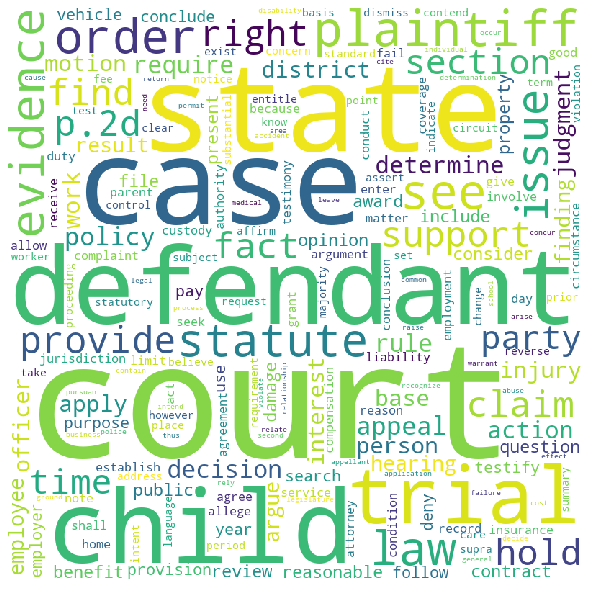

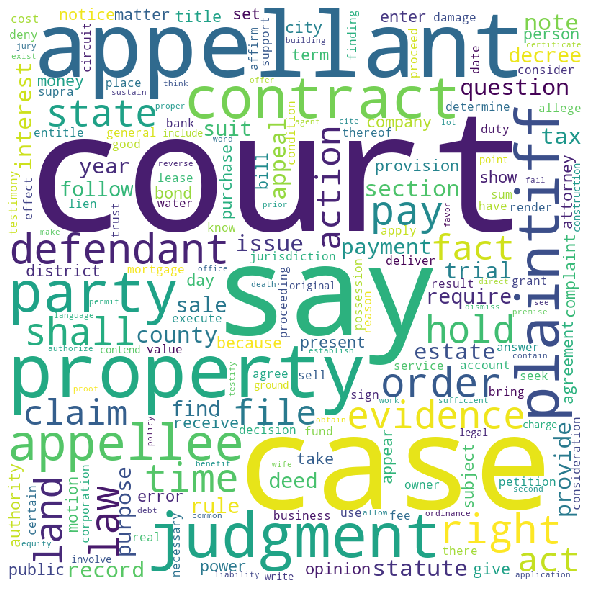

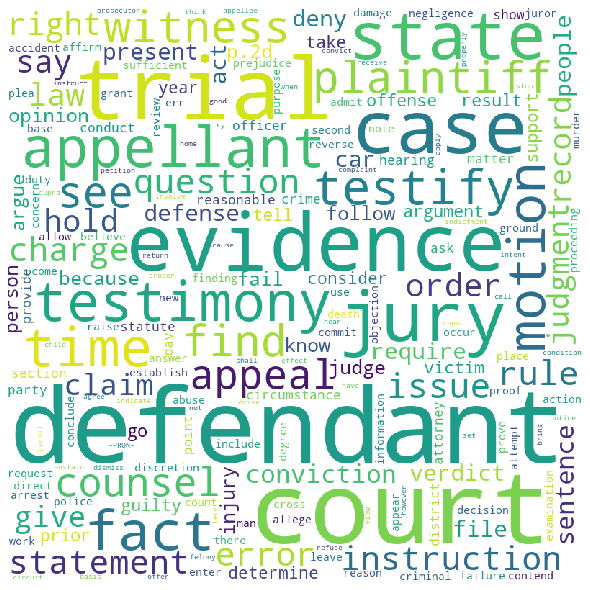

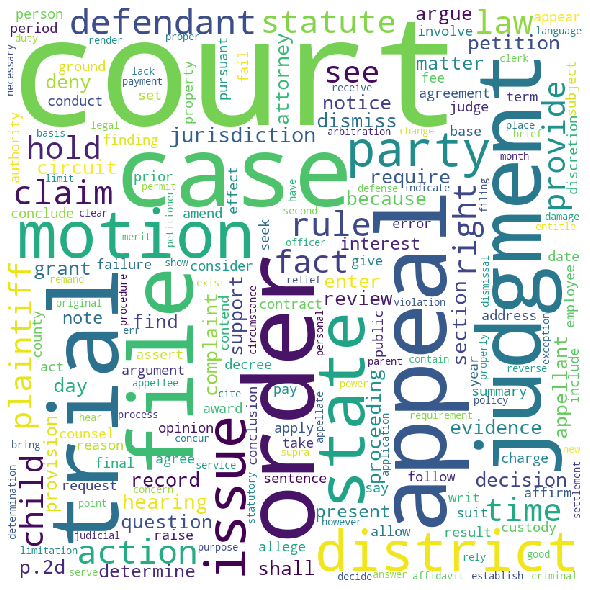

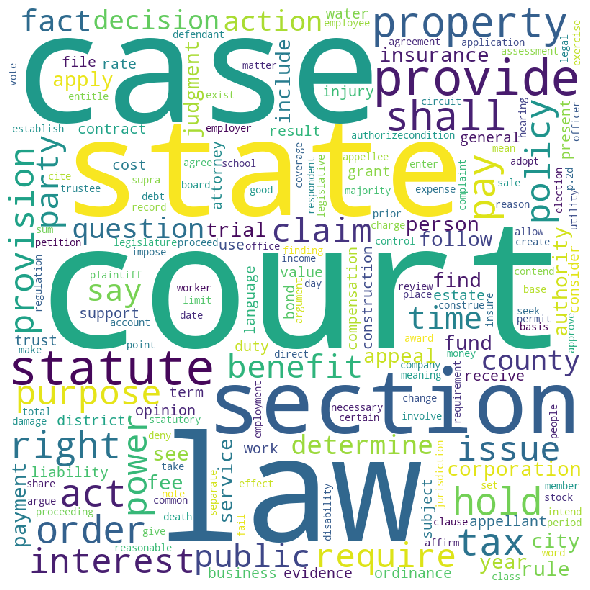

...

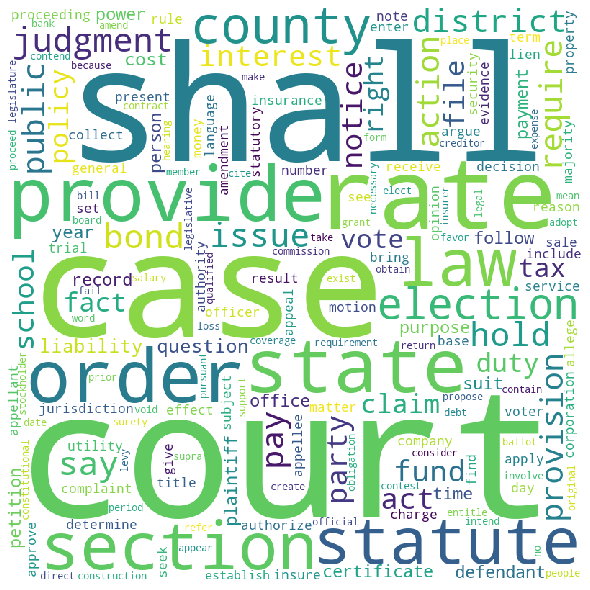

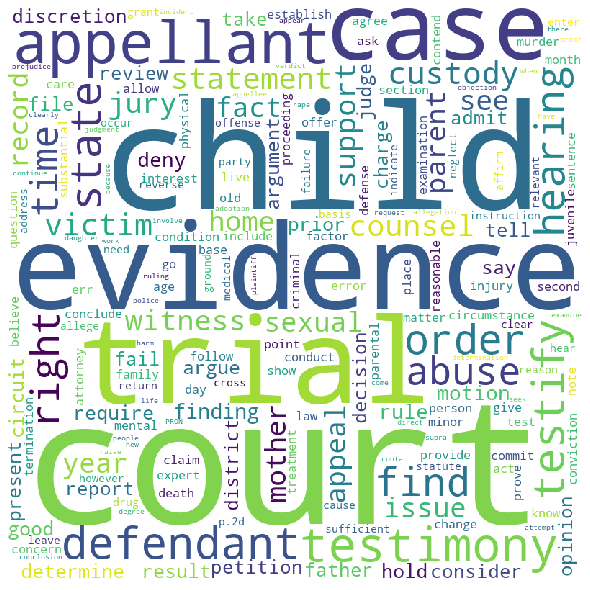

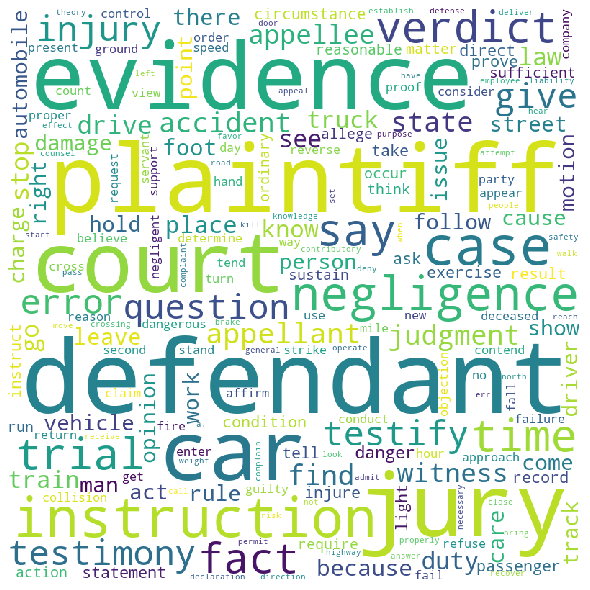

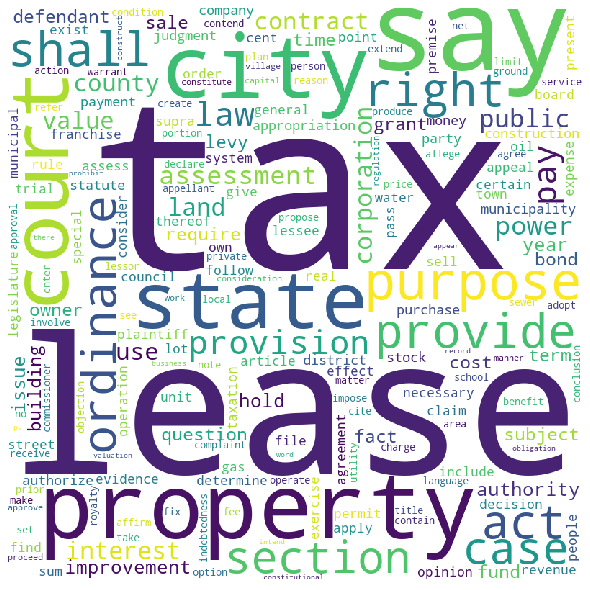

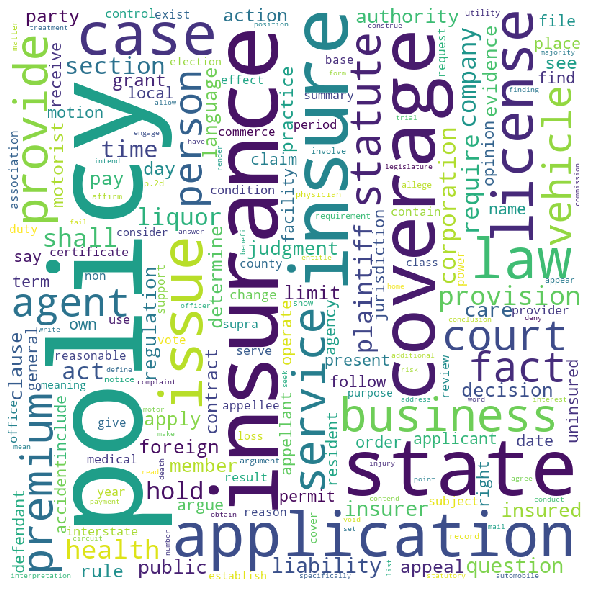

In [8]:
# BEGIN VALIDATION. THIS WILL TAKE SOME TIME.

num_topics = [3, 5, 10, 15, 20]
train_perplexity = []
test_perplexity = []
train_coherence = []
test_coherence = []
min_cite_dist_mean = []
min_cite_dist_sd = []
avg_cite_dist_mean = []
avg_cite_dist_sd = []
max_cite_dist_mean = []
max_cite_dist_sd = []

test_ids = data.loc[split:, 'case_id'].to_list()
data = None

wordcloud_header = '../wordclouds/baseline_12k'
output_header = '../validation_output'

start = time.time()

for nt in num_topics:
    iter_start=time.time()
    print(f'Processing model with {nt} topics...')
    temp_time= time.time()
    lda = LdaModel(train_op_corpus, id2word=op_dictionary, num_topics=nt)
    print(f'Model training done. Time: {round(time.time()-temp_time)}')
    print('Computing perplexity on train set.')
    temp_time= time.time()
    train_perplexity.append(get_perplexity(lda, train_op_corpus))
    print(f'Done. Time: {round(time.time()-temp_time)}')
    print('Computing perplexity on test set.')
    temp_time= time.time()
    test_perplexity.append(get_perplexity(lda, test_op_corpus))
    print(f'Done. Time: {round(time.time()-temp_time)}')
    print('Computing coherence on train set.')
    temp_time= time.time()
    train_coherence.append(get_coherence(lda, train_ops.to_list(), op_dictionary))
    print(f'Done. Time: {round(time.time()-temp_time)}')
    print('Computing coherence on test set.')
    temp_time= time.time()
    test_coherence.append(get_coherence(lda, test_ops.to_list(), op_dictionary))
    print(f'Done. Time: {round(time.time()-temp_time)}')
    print('Computing citation graph validation metrics.')
    temp_time= time.time()
    metric_cols = ['min_cite_dist', 'mean_cite_dist', 'max_cite_dist']
    citation_dist_results = knn_citation_validation(test_ids, lda, test_op_corpus, big_subgraph, 5)[metric_cols]
    min_cite_dist_mean.append(citation_dist_results.min_cite_dist.mean())
    min_cite_dist_sd.append(citation_dist_results.min_cite_dist.std())
    avg_cite_dist_mean.append(citation_dist_results.mean_cite_dist.mean())
    avg_cite_dist_sd.append(citation_dist_results.mean_cite_dist.std())
    max_cite_dist_mean.append(citation_dist_results.max_cite_dist.mean())
    max_cite_dist_sd.append(citation_dist_results.max_cite_dist.std())
    print(f'Done. Time: {round(time.time()-temp_time)}')
    print('Saving wordclouds...')
    temp_time= time.time()
    os.mkdir(os.path.join(wordcloud_header, f'num_topics_{nt}'))
    get_wordclouds(lda, save_file=os.path.join(wordcloud_header, f'num_topics_{nt}'), num_topics=nt)
    print(f'Done. Time: {round(time.time()-temp_time)}')
    print(f'Done with full iteration. TOTAL TIME: {round(time.time()-iter_start)}')
    print('######################################')
print(f'FINISHED. TOTAL TIME ELAPSED: {time.time()-start}')
   
results_df = pd.DataFrame({'num_topics': num_topics,
                          'train_perplexity': train_perplexity,
                          'test_perplexity': test_perplexity,
                          'train_coherence': train_coherence,
                          'test_coherence': test_coherence,
                          'min_cite_dist_mean': min_cite_dist_mean,
                          'min_cite_dist_sd': min_cite_dist_sd,
                          'avg_cite_dist_mean': avg_cite_dist_mean,
                          'avg_cite_dist_sd': avg_cite_dist_sd,
                          'max_cite_dist_mean': max_cite_dist_mean,
                          'max_cite_dist_sd': max_cite_dist_sd})

results_df.to_csv(os.path.join(output_header, 'baseline_12k.csv'), index=False)

train_ops= None
test_ops = None

In [10]:
results_df

,num_topics,train_perplexity,test_perplexity,train_coherence,test_coherence,min_cite_dist_mean,min_cite_dist_sd,avg_cite_dist_mean,avg_cite_dist_sd,max_cite_dist_mean,max_cite_dist_sd
0,3,176.500775,189.716466,0.321664,0.320699,4.500837,1.245418,5.812720,1.029984,7.110460,1.096598
1,5,172.022770,189.026966,0.359662,0.358101,4.334728,1.244194,5.693473,1.005360,7.007950,1.080062
2,10,167.469881,192.938730,0.360918,0.360191,4.199163,1.319779,5.576653,1.070526,6.900837,1.137566
3,15,163.571061,195.783152,0.391368,0.389606,4.089121,1.336611,5.480251,1.107879,6.824686,1.163406
4,20,163.167793,202.779927,0.383385,0.380287,4.058577,1.335010,5.479247,1.111934,6.871548,1.164489
